In [ ]:
# Copyright (c) Meta Platforms, Inc. and affiliates.

# Video segmentation with SAM 2

This notebook shows how to use SAM 2 for interactive segmentation in videos. It will cover the following:

- adding clicks (or box) on a frame to get and refine _masklets_ (spatio-temporal masks)
- propagating clicks (or box) to get _masklets_ throughout the video
- segmenting and tracking multiple objects at the same time

We use the terms _segment_ or _mask_ to refer to the model prediction for an object on a single frame, and _masklet_ to refer to the spatio-temporal masks across the entire video. 

<a target="_blank" href="https://colab.research.google.com/github/facebookresearch/sam2/blob/main/notebooks/video_predictor_example.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>

## Set-up

In [1]:
import os
# if using Apple MPS, fall back to CPU for unsupported ops
os.environ["PYTORCH_ENABLE_MPS_FALLBACK"] = "1"
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image

In [2]:
# select the device for computation
if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")
print(f"using device: {device}")

if device.type == "cuda":
    # use bfloat16 for the entire notebook
    torch.autocast("cuda", dtype=torch.bfloat16).__enter__()
    # turn on tfloat32 for Ampere GPUs (https://pytorch.org/docs/stable/notes/cuda.html#tensorfloat-32-tf32-on-ampere-devices)
    if torch.cuda.get_device_properties(0).major >= 8:
        torch.backends.cuda.matmul.allow_tf32 = True
        torch.backends.cudnn.allow_tf32 = True
elif device.type == "mps":
    print(
        "\nSupport for MPS devices is preliminary. SAM 2 is trained with CUDA and might "
        "give numerically different outputs and sometimes degraded performance on MPS. "
        "See e.g. https://github.com/pytorch/pytorch/issues/84936 for a discussion."
    )

using device: cuda


### Load Util Functions

In [3]:
from video_labeller_utils import *

### Loading the SAM 2 video predictor

In [4]:
from sam2.build_sam import build_sam2_video_predictor

sam2_checkpoint = "../checkpoints/sam2.1_hiera_large.pt"
model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"

predictor = build_sam2_video_predictor(model_cfg, sam2_checkpoint, device=device)

#### Select an example video

We assume that the video is stored as a list of JPEG frames with filenames like `<frame_index>.jpg`.

For your custom videos, you can extract their JPEG frames using ffmpeg (https://ffmpeg.org/) as follows:
```
ffmpeg -i <your_video>.mp4 -q:v 2 -start_number 0 <output_dir>/'%05d.jpg'
```
where `-q:v` generates high-quality JPEG frames and `-start_number 0` asks ffmpeg to start the JPEG file from `00000.jpg`.

In [5]:
# `video_dir` a directory of JPEG frames with filenames like `<frame_index>.jpg`
video_dir = "/home/joseph/Documents/project/videos/foosball_videos/Webcam/2024-05-04-140349_jpg"

# scan all the JPEG frame names in this directory
frame_names = get_frame_name_list(video_dir)


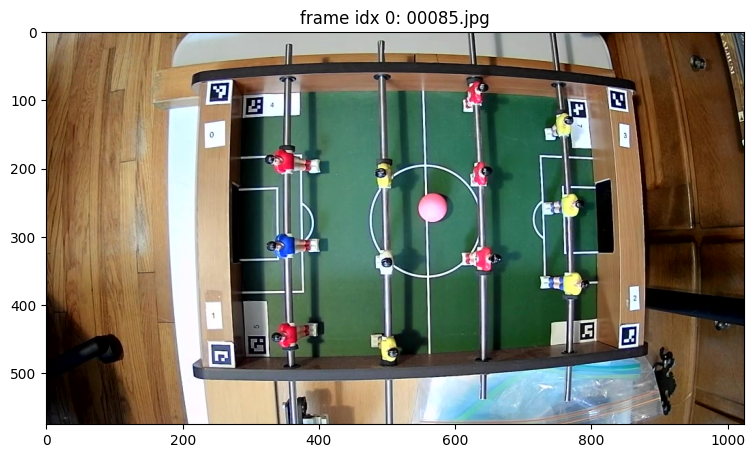

In [6]:
# take a look the first video frame
frame_idx = 0
plt.figure(figsize=(9, 6))
frame_title = f"frame idx {frame_idx}: " + frame_names[frame_idx]
plt.title(frame_title)
plt.imshow(Image.open(os.path.join(video_dir, frame_names[frame_idx])))

#### Initialize the inference state

SAM 2 requires stateful inference for interactive video segmentation, so we need to initialize an **inference state** on this video.

During initialization, it loads all the JPEG frames in `video_path` and stores their pixels in `inference_state` (as shown in the progress bar below).

In [7]:
inference_state = predictor.init_state(video_path=video_dir)

frame loading (JPEG): 100%|███████████████████| 431/431 [00:09<00:00, 47.22it/s]


## Initialize the detection masks

In [15]:
# add the foosball men
frame_idx = 0

ball_clicks = [[566, 264]];

#from left to right
# top to bottom
rod_0_foosman_0_clicks = [[323,190], [382, 198]]
rod_0_foosman_1_clicks = [[354,315],[391,315]]
rod_0_foosman_2_clicks = [[352,448],[391,438]]

rod_1_foosman_0_clicks = [[493,211],[505,214]]
rod_1_foosman_1_clicks = [[498,340],[486,340]]
rod_1_foosman_2_clicks = [[506,459],[480,458]]

rod_2_foosman_0_clicks = [[635,88],[616,114]]
rod_2_foosman_1_clicks = [[640,213],[625,223]]
rod_2_foosman_2_clicks = [[658,344],[618,341]]

rod_3_foosman_0_clicks = [[763,134],[738,150]]
rod_3_foosman_1_clicks = [[772,256],[737,262]]
rod_3_foosman_2_clicks = [[784,373],[731,370]]


In [16]:
num_frames = len(frame_names)
num_items = 13
label_array = np.zeros((num_frames, num_items, 4))

In [17]:
id_list_0 = [0, 1, 2]
position_group_0 = [rod_0_foosman_0_clicks, rod_0_foosman_1_clicks, rod_0_foosman_2_clicks]

id_list_1 = [3, 4, 5]
position_group_1 = [rod_1_foosman_0_clicks, rod_1_foosman_1_clicks, rod_1_foosman_2_clicks]

id_list_2 = [6,7, 8]
position_group_2 = [rod_2_foosman_0_clicks, rod_2_foosman_1_clicks, rod_2_foosman_2_clicks]

id_list_3 = [9, 10, 11, 12]
position_group_3 = [rod_3_foosman_0_clicks, rod_3_foosman_1_clicks, rod_3_foosman_2_clicks, ball_clicks]

num_groups = 4
id_super_list = [id_list_0, id_list_1, id_list_2, id_list_3]
position_super_list = [position_group_0, position_group_1, position_group_2, position_group_3]

In [ ]:
def add_label(obj_id, positions, predictor, inference_state, frame_idx, prompts, positive=True):
    #labels = np.ones(numClicks)      
    points = np.array(positions, dtype=np.float32)
    labels = np.ones(points.shape[0])
    if(positive == False):
        labels = np.zeros(points.shape[0])
    prompts[obj_id] = points, labels
    _, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=frame_idx,
    obj_id=obj_id,
    points=points,
    labels=labels,
    )
    return out_obj_ids, out_mask_logits

## Testing negative labels

In [ ]:
rod_0_foosman_0_clicks_negative = [[350, 219], [351, 158]]

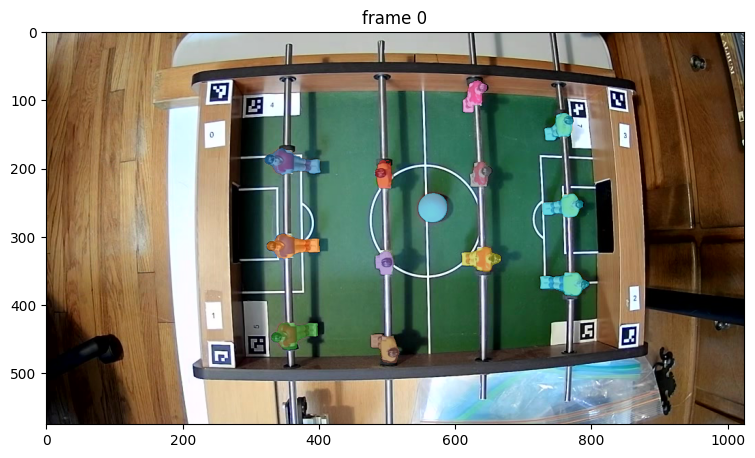

In [18]:
# show the results on the current (interacted) frame
group_idx = 0
positions = position_super_list[group_idx]
foos_id_list = id_super_list[group_idx]

labels = np.array([1, 1], np.int32)
prompts = {}
predictor.reset_state(inference_state)
# out_obj_ids, out_mask_logits = initialize_labels(foos_id_list, positions, predictor, inference_state, frame_idx, prompts)

for idx, id_list in enumerate(id_super_list):
    positions = position_super_list[idx]
    # for sub_idx, clicks in enumerate(positions):
    #     item_id = id_list[sub_idx]    
    #     add_label(item_id, clicks, predictor, inference_state, frame_idx, prompts, positive=True)
    out_obj_ids, out_mask_logits = initialize_labels(id_list, positions, predictor, inference_state, frame_idx, prompts)


# out_obj_ids, out_mask_logits = add_label(0, rod_0_foosman_0_clicks_negative, predictor, inference_state, frame_idx, prompts, positive=False)


# show the results on the current (interacted) frame
plt.figure(figsize=(9, 6))
plt.title(f"frame {frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[frame_idx])))
for i, out_obj_id in enumerate(out_obj_ids):
    #show_points(*prompts[out_obj_id], plt.gca())
    show_mask((out_mask_logits[i] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_id)

In [ ]:
print(prompts)
print(foos_id_list)
print(out_obj_ids)

In [ ]:
label_array = np.zeros((num_frames, num_items, 4))
video_segments = propagate_in_video(predictor, inference_state)


In [ ]:
label_array = np.zeros((num_frames, num_items, 4))

obtain_bounding_boxes(frame_names, video_segments, label_array)


In [ ]:

vis_frame_stride = 20
plt.close("all")
for out_frame_idx in range(0, len(frame_names), vis_frame_stride):
    plt.figure(figsize=(6, 4))
    plt.title(f"frame {out_frame_idx}")
    plt.imshow(Image.open(os.path.join(video_dir, frame_names[out_frame_idx])))
    frame_labels = label_array[out_frame_idx]
    for object_idx in range(len(frame_labels)):
        label = frame_labels[object_idx]
        cx = label[0]
        cy = label[1]
        w = label[2]
        h = label[3]
        # negative bounding box - not detected
        if(cx >= 0):
            draw_bounding_box_from_scaled_label(cx, cy, w, h, (1,1), plt.gca())
            plt.plot(cx,cy,'ro', markersize=2)

## Properly run bounding box detection

In [19]:
video_segments_super_list = {}
prompts = {}

for group_idx in range(0, num_groups):
    print("labelling group ", group_idx)
    predictor.reset_state(inference_state)
    positions = position_super_list[group_idx]
    id_list = id_super_list[group_idx]
    out_obj_ids, out_mask_logits = initialize_labels(id_list, positions, predictor, inference_state, frame_idx, prompts)
    video_segments = propagate_in_video(predictor, inference_state)
    video_segments_super_list[group_idx] = video_segments
    obtain_bounding_boxes(frame_names, video_segments, label_array)

labelling group  0


propagate in video: 100%|█████████████████████| 431/431 [01:55<00:00,  3.74it/s]


labelling group  1


propagate in video: 100%|█████████████████████| 431/431 [01:55<00:00,  3.73it/s]


labelling group  2


propagate in video: 100%|█████████████████████| 431/431 [01:55<00:00,  3.73it/s]


labelling group  3


propagate in video: 100%|█████████████████████| 431/431 [02:14<00:00,  3.20it/s]


In [20]:
negative_coords = np.argwhere(label_array == -1)
print(negative_coords)

[]


/tmp/ipykernel_158609/4063391865.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(6, 4))


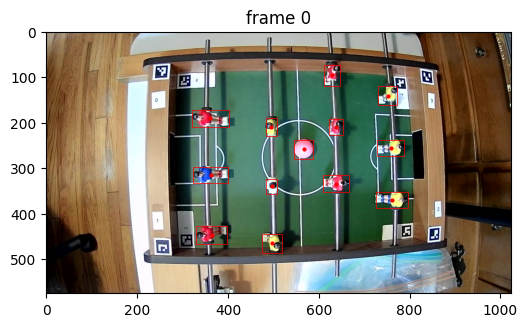

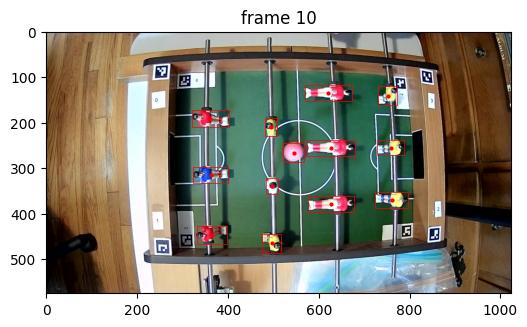

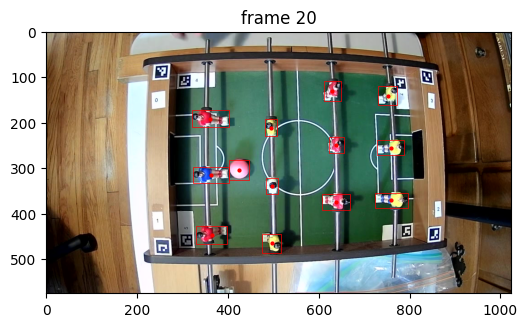

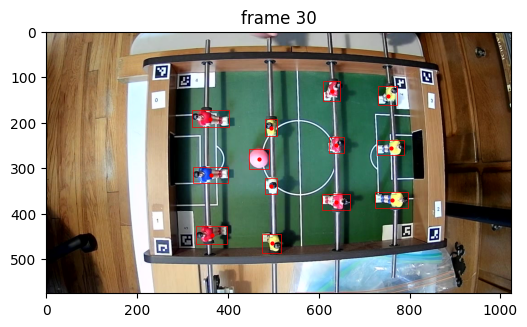

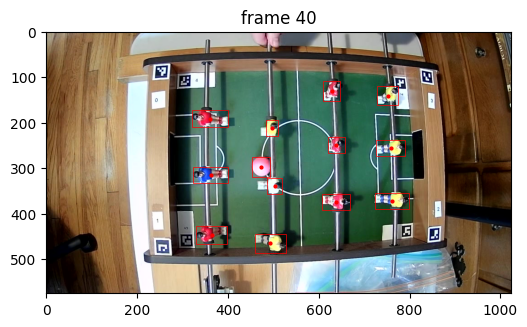

...

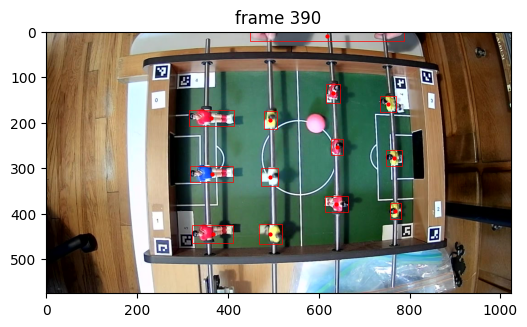

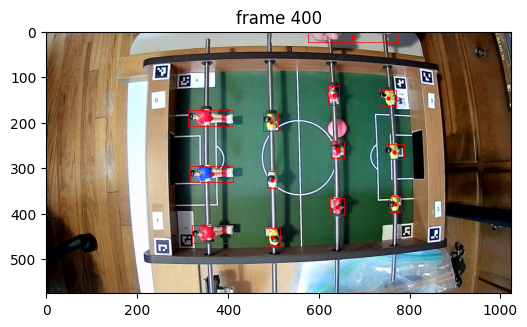

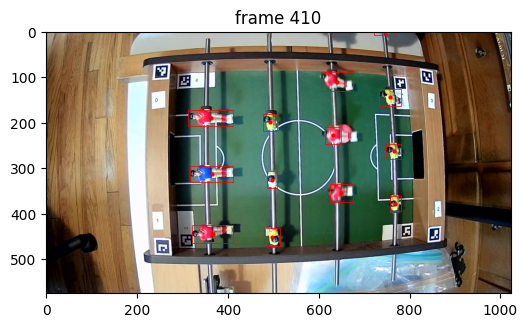

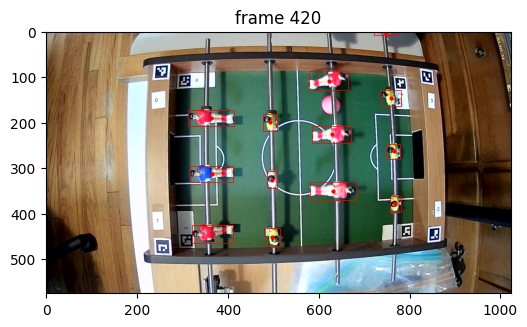

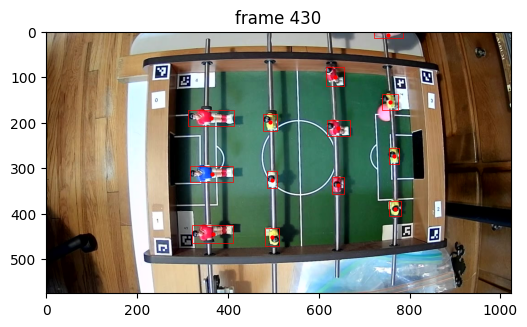

In [21]:
# render the segmentation results every few frames
vis_frame_stride = 10
plt.close("all")
for out_frame_idx in range(0, len(frame_names), vis_frame_stride):
    plt.figure(figsize=(6, 4))
    plt.title(f"frame {out_frame_idx}")
    plt.imshow(Image.open(os.path.join(video_dir, frame_names[out_frame_idx])))
    frame_labels = label_array[out_frame_idx]
    for object_idx in range(len(frame_labels)):
        label = frame_labels[object_idx]
        cx = label[0]
        cy = label[1]
        w = label[2]
        h = label[3]
        # negative bounding box - not detected
        if(cx >= 0):
            draw_bounding_box_from_scaled_label(cx, cy, w, h, (1,1), plt.gca())
            plt.plot(cx,cy,'ro', markersize=2)

In [ ]:
    plt.imshow(Image.open(os.path.join(video_dir, frame_names[out_frame_idx])))
    frame_labels = label_array[out_frame_idx]
    for object_idx in range(len(frame_labels)):
        label = frame_labels[object_idx]
        cx = label[0]
        cy = label[1]
        w = label[2]
        h = label[3]
        # negative bounding box - not detected
        if(cx >= 0):
            draw_bounding_box_from_scaled_label(cx, cy, w, h, (1,1), plt.gca())
            plt.plot(cx,cy,'ro', markersize=2)

In [2]:
foosman_id = 4
group = 0
frame_idx = 110
out_mask = video_segments_super_list[group][frame_idx][foosman_id]
show_mask(out_mask, plt.gca(), obj_id=foosman_id)
frame_labels = label_array[frame_idx]
label = frame_labels[foosman_id]
cx = label[0]
cy = label[1]
w = label[2]
h = label[3]
draw_bounding_box_from_scaled_label(cx, cy, w, h, (1,1), plt.gca())

NameError: name 'video_segments_super_list' is not defined

In [33]:
# get image shape
#image = img.imread('/content/drive/My Drive/Colab Notebooks/rusty.png')
# matplotlib.pyplot.imread()
img_0 = np.asarray(Image.open(os.path.join(video_dir, frame_names[0])))
print(img_0.shape)
img_height,img_width = img_0.shape[0], img_0.shape[1]

(576, 1024, 3)


In [34]:
print(label_array.shape)
print(label_array[0][0])

(431, 13, 4)
[361.  190.5  82.   39. ]


### Apply scaling


In [35]:
label_array[:,:,0]/=img_width
label_array[:,:,1]/=img_height
label_array[:,:,2]/=img_width
label_array[:,:,3]/=img_height


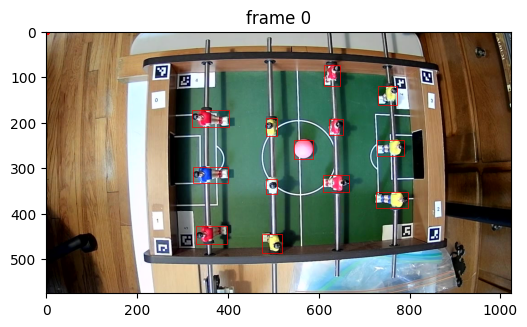

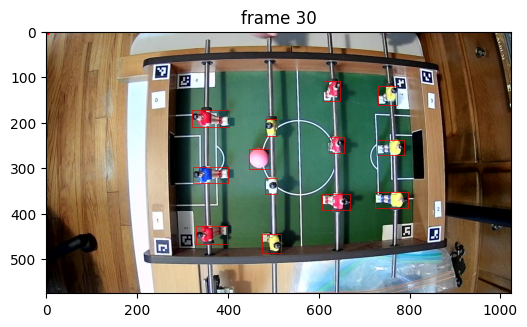

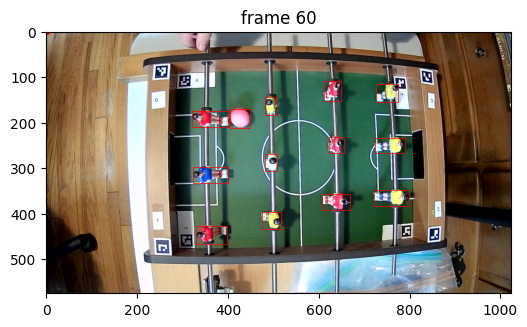

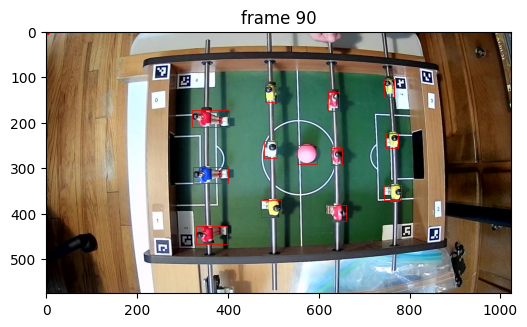

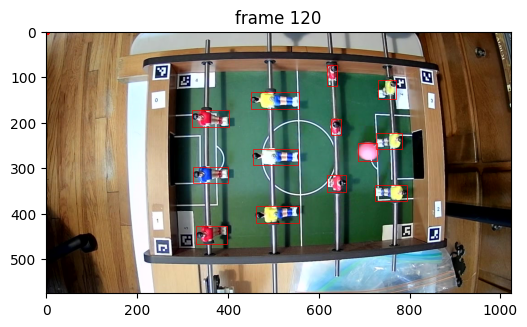

...

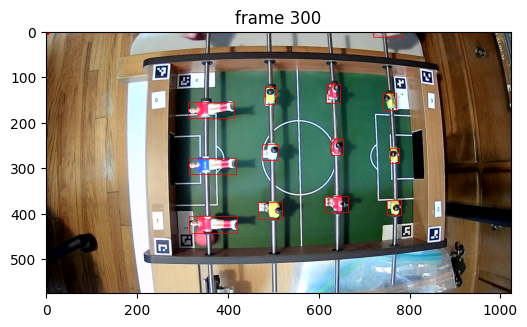

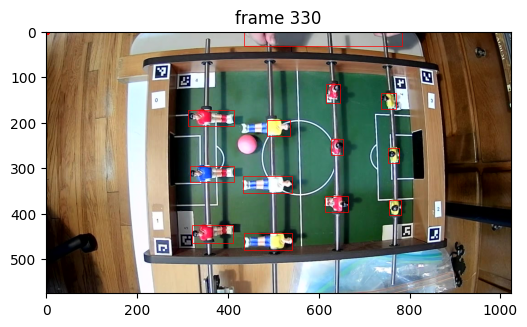

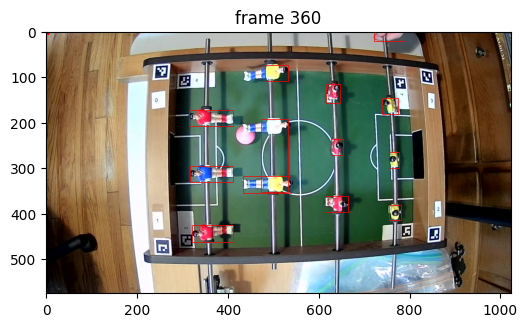

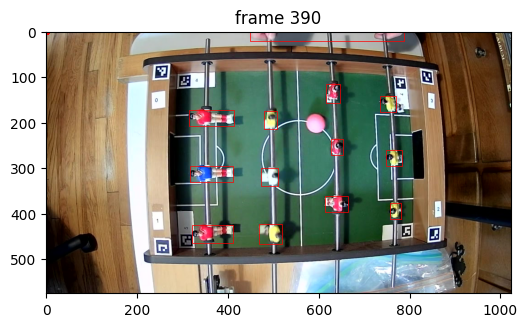

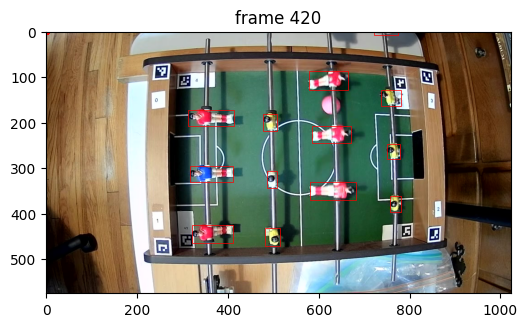

In [36]:
vis_frame_stride = 30
plt.close("all")
for out_frame_idx in range(0, len(frame_names), vis_frame_stride):
    plt.figure(figsize=(6, 4))
    plt.title(f"frame {out_frame_idx}")
    plt.imshow(Image.open(os.path.join(video_dir, frame_names[out_frame_idx])))
    frame_labels = label_array[out_frame_idx]
    for object_idx in range(len(frame_labels)):
        label = frame_labels[object_idx]
        cx = label[0]
        cy = label[1]
        w = label[2]
        h = label[3]
        # negative bounding box - not detected
        if(cx >= 0):
            draw_bounding_box_from_scaled_label(cx, cy, w, h, (img_width,img_height), plt.gca())
            plt.plot(cx,cy,'ro', markersize=2)

## Save labels to files

In [37]:
output_dir = os.path.join(video_dir, "labels")
if os.path.exists(output_dir) == False:
    os.makedirs(output_dir)

In [38]:
for frame_idx in range(0, len(frame_names)):
    frame_name = frame_names[frame_idx]
    frame_labels = label_array[frame_idx]
    write_label_data_to_file(frame_name, output_dir, frame_labels)

## Verify yolo-format annotations

In [39]:
class_dictionary = {0: "ball", 1:"foosman"}

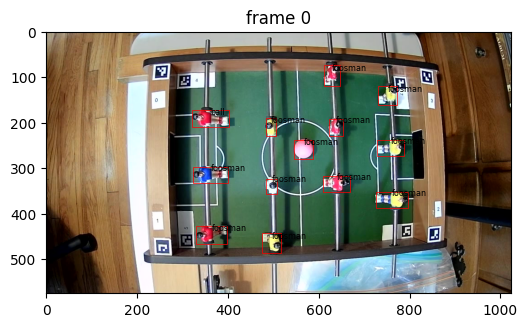

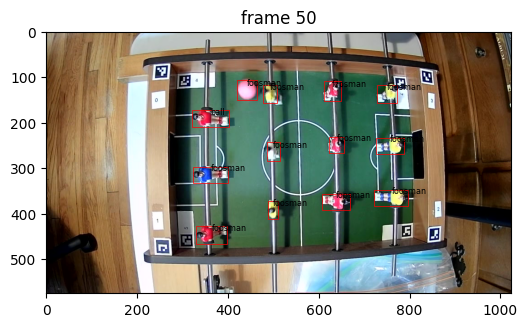

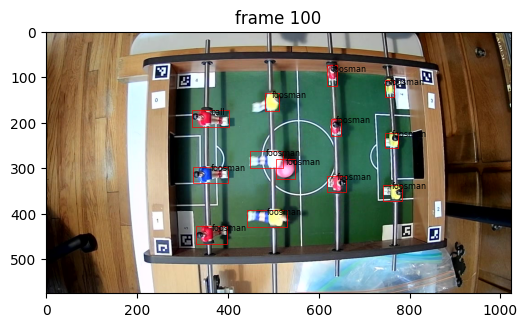

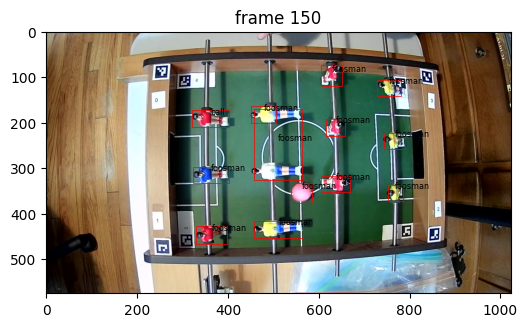

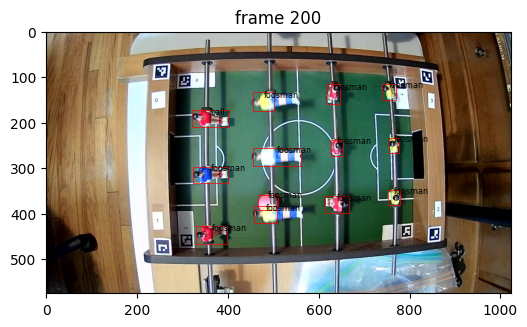

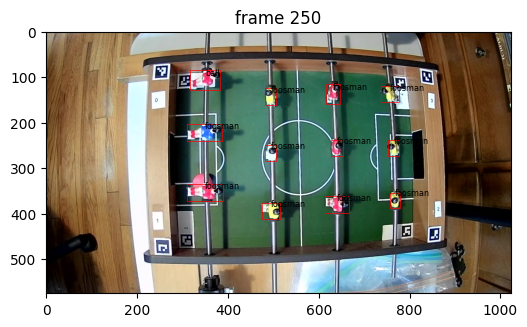

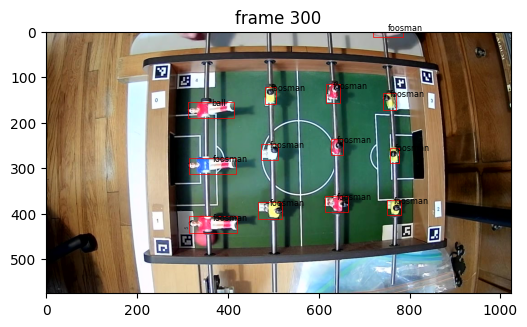

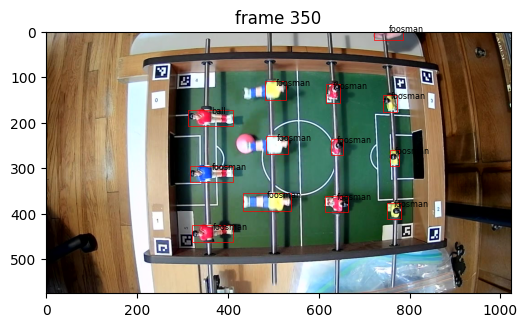

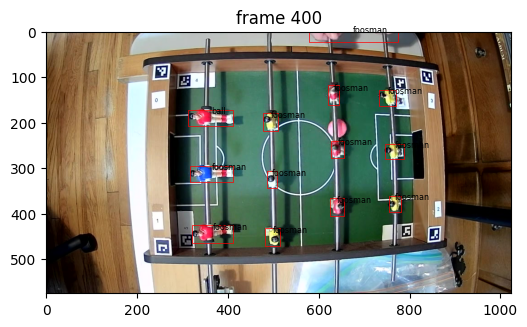

In [40]:
# read files back and check bounding boxes
vis_frame_stride = 50
plt.close("all")
for out_frame_idx in range(0, len(frame_names), vis_frame_stride):
    frame_name = frame_names[out_frame_idx]
    plt.figure(figsize=(6, 4))
    plt.title(f"frame {out_frame_idx}")
    plt.imshow(Image.open(os.path.join(video_dir, frame_name)))

    basename= os.path.splitext(os.path.basename(frame_name))[0]
    label_file_path = os.path.join(output_dir, basename + ".txt")

    annotation_list = []
    with open(label_file_path, "r") as file:
        annotation_list = file.read().split("\n")[:-1]
        annotation_list = [x.split(" ") for x in annotation_list]
        annotation_list = [[float(y) for y in x ] for x in annotation_list]
    
    for object_idx in range(len(annotation_list)):
        label = annotation_list[object_idx]
        class_id = label[0]
        cx = label[1]
        cy = label[2]
        w = label[3]
        h = label[4]
        draw_bounding_box_from_scaled_label(cx, cy, w, h, (img_width,img_height), plt.gca())
        cx_scaled = cx * img_width
        cy_scaled = cy * img_height
        plt.text(cx_scaled, cy_scaled - 10, class_dictionary[(int(class_id))], fontsize='xx-small')